# ❓ <font color='green'> <u> PROBLEM STATEMENT (PCA_Wine_Data) </u>

### <font color='blue'> Perform Principal component analysis (PCA) and perform clustering using first 3 principal component scores (both <font color='candy'>Heirarchical and k mean clustering </font>(scree plot or elbow curve) )and obtain optimum number of clusters and check whether we have obtained same number of clusters with the original data (class column we have ignored at the begining who shows it has <font color='candy'>3 clusters</font>).

The data is about the results of a chemical analysis of three types of wines.
The analysis determined the quantities of 13 constituents found in each of the three types of wines.

###### Attribute Information:
+ Type
+ Alcohol
+ Malic acid
+ Ash
+ Alcalinity of ash
+ Magnesium
+ Phenols
+ Flavanoids
+ Nonflavanoid phenols
+ Proanthocyanins
+ Color intensity
+ Hue
+ Dilution
+ Proline

___

## Principal component analysis (PCA) 
+ #### It's a linear dimensionality reduction technique, that reduces the dimensionality of large data sets.
+ #### This is accomplished by linearly transforming the data onto a new coordinate system (principal components) such that the directions capturing the largest variation in the data can be easily identified.
+ #### Many studies use the first two principal components in order to plot the data in two dimensions and to visually identify clusters of closely related data points.

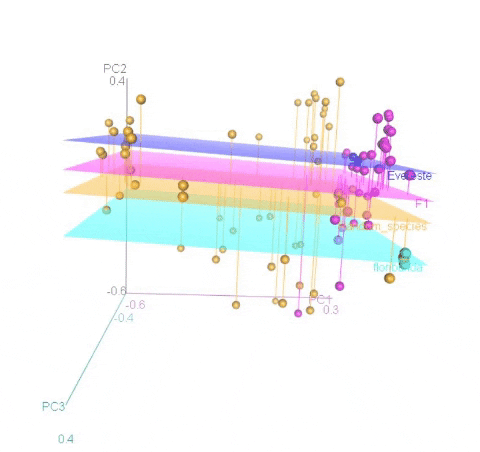

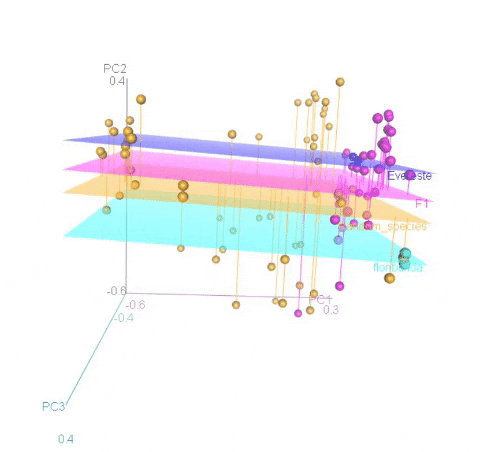

___

* ### <font color = 'blue'> <u> IMPORT NECESSARY LIBRARIES </u>

In [73]:
import pandas as pd 
import numpy as np 
import seaborn as sns 
import matplotlib.pyplot as plt 
%matplotlib inline
import warnings 
warnings.filterwarnings('ignore')
plt.rcParams['figure.figsize'] = (10,5)
plt.rcParams['figure.dpi'] = 300
sns.set_theme(style='darkgrid', palette='dark')

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering, KMeans
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score, silhouette_score
from yellowbrick.cluster import SilhouetteVisualizer

___

* ### <font color = 'blue'> <u> READ DATA </u>

In [3]:
# Importing Data 
raw_data = pd.read_csv('https://raw.githubusercontent.com/SwatiVPatil/Data_sets/main/wine.csv')
raw_data

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
0,1,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,1,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,1,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,1,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,3,13.71,5.65,2.45,20.5,95,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740
174,3,13.40,3.91,2.48,23.0,102,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750
175,3,13.27,4.28,2.26,20.0,120,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835
176,3,13.17,2.59,2.37,20.0,120,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840


* #### First Column "Type" is an Target Variable so we neglect it for our PCA dimensionality reduction method. As PCA is unsupervised machine learning.

In [6]:
# Independent Variables:
df = raw_data.drop(['Type'], axis = 1)
df

,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
0,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735
...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,13.71,5.65,2.45,20.5,95,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740
174,13.40,3.91,2.48,23.0,102,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750
175,13.27,4.28,2.26,20.0,120,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835
176,13.17,2.59,2.37,20.0,120,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840


In [8]:
# Target Variable:
y = raw_data['Type']
y

0      1
1      1
2      1
3      1
4      1
      ..
173    3
174    3
175    3
176    3
177    3
Name: Type, Length: 178, dtype: int64

___

* ### <font color = 'blue'> <u> PERFORM EDA </u>

* ##### <font color ='green'> <u>Data Summary</u>

In [14]:
raw_data.shape

(178, 14)

In [15]:
raw_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178 entries, 0 to 177
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Type             178 non-null    int64  
 1   Alcohol          178 non-null    float64
 2   Malic            178 non-null    float64
 3   Ash              178 non-null    float64
 4   Alcalinity       178 non-null    float64
 5   Magnesium        178 non-null    int64  
 6   Phenols          178 non-null    float64
 7   Flavanoids       178 non-null    float64
 8   Nonflavanoids    178 non-null    float64
 9   Proanthocyanins  178 non-null    float64
 10  Color            178 non-null    float64
 11  Hue              178 non-null    float64
 12  Dilution         178 non-null    float64
 13  Proline          178 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 19.6 KB


In [13]:
y.shape

(178,)

In [ ]:
y.info

* ##### <font color ='green'> <u>Descriptive statistics</u>

In [19]:
raw_data.describe()

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
count,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000
mean,1.938202,13.000618,2.336348,2.366517,19.494944,99.741573,2.295112,2.029270,0.361854,1.590899,5.058090,0.957449,2.611685,746.893258
std,0.775035,0.811827,1.117146,0.274344,3.339564,14.282484,0.625851,0.998859,0.124453,0.572359,2.318286,0.228572,0.709990,314.907474
min,1.000000,11.030000,0.740000,1.360000,10.600000,70.000000,0.980000,0.340000,0.130000,0.410000,1.280000,0.480000,1.270000,278.000000
25%,1.000000,12.362500,1.602500,2.210000,17.200000,88.000000,1.742500,1.205000,0.270000,1.250000,3.220000,0.782500,1.937500,500.500000
50%,2.000000,13.050000,1.865000,2.360000,19.500000,98.000000,2.355000,2.135000,0.340000,1.555000,4.690000,0.965000,2.780000,673.500000
75%,3.000000,13.677500,3.082500,2.557500,21.500000,107.000000,2.800000,2.875000,0.437500,1.950000,6.200000,1.120000,3.170000,985.000000
max,3.000000,14.830000,5.800000,3.230000,30.000000,162.000000,3.880000,5.080000,0.660000,3.580000,13.000000,1.710000,4.000000,1680.000000


* ##### <font color ='green'><u> Checking For Null Values: </u>

In [18]:
# Checking For null Value if any:

raw_data.isna().sum()

Type               0
Alcohol            0
Malic              0
Ash                0
Alcalinity         0
Magnesium          0
Phenols            0
Flavanoids         0
Nonflavanoids      0
Proanthocyanins    0
Color              0
Hue                0
Dilution           0
Proline            0
dtype: int64

* ##### <font color ='green'><u> Checking for Duplicate Records and Removing if any </u>

In [20]:
raw_data.duplicated().sum()

0

> * #### There are 14 Variables with 178 records, which will cause curse of dimensionality while model building. 
> * #### All variables are of Numeric Datatype, So no need for encoding the data.
> * #### In Discriptive Statistics we see data has variable range, so we perform Standardisation on data.
> * #### No null value observed.
>* #### No Duplicated record found.

___

* ### <font color = 'blue'> <u> DATA VISUALISATION </u>

* ##### <font color ='green'><u> Histogram for Independent Variables: </u>

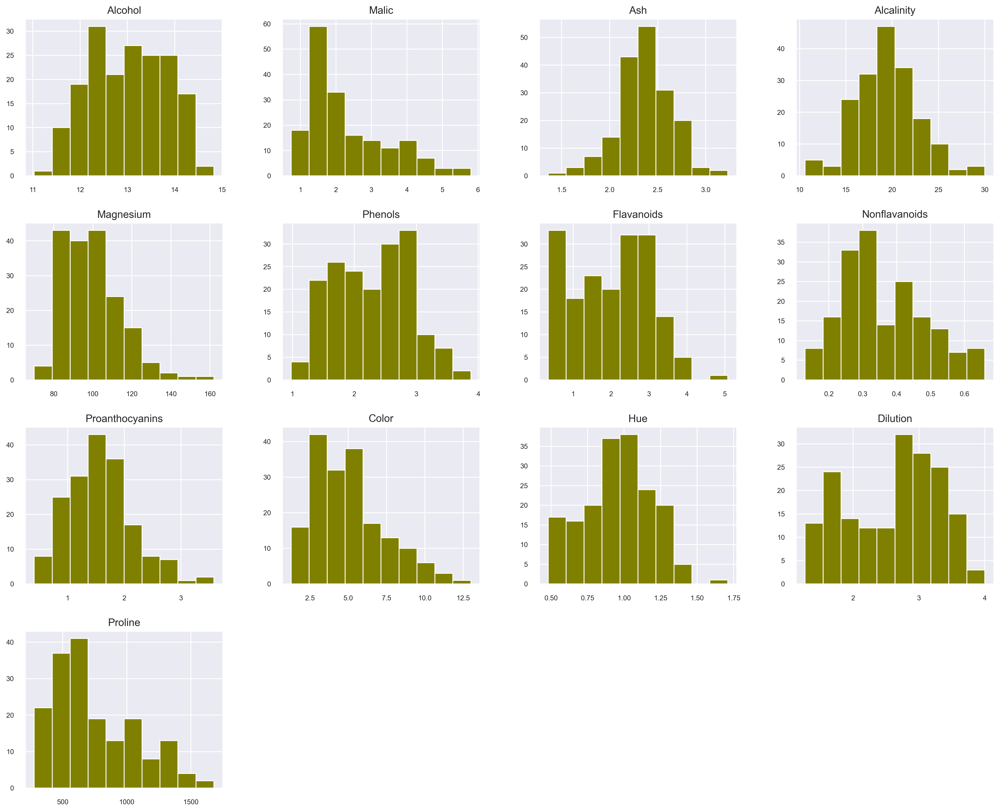

In [74]:
df.hist(xlabelsize = 8, ylabelsize= 8, figsize= (20,16), color = 'olive')
plt.show()

* ##### <font color ='green'><u> Barplot for Target Variable: </u>

<Axes: xlabel='Type', ylabel='count'>

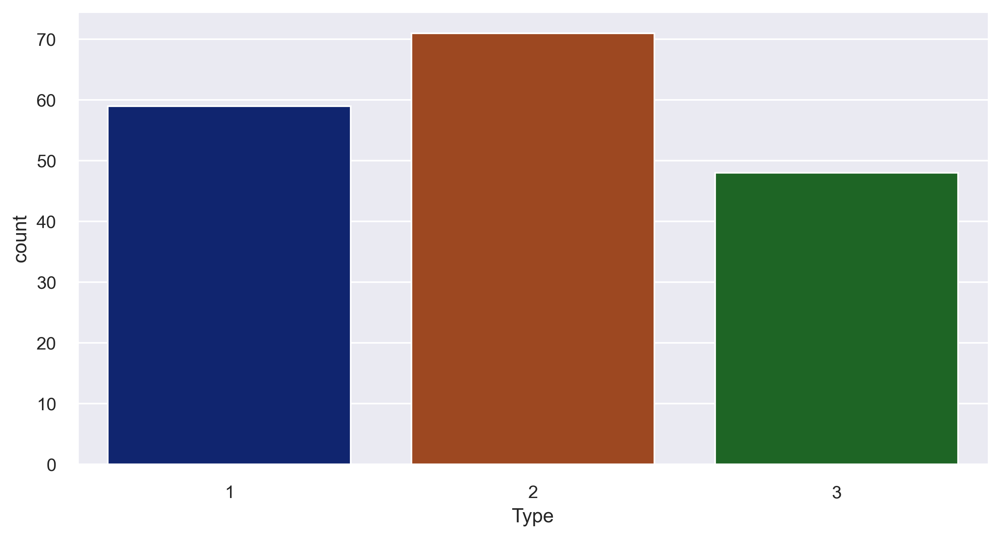

In [75]:
sns.countplot(x = raw_data['Type'])

* ##### <font color ='green'><u> Boxplots for Independet Variables: </u>

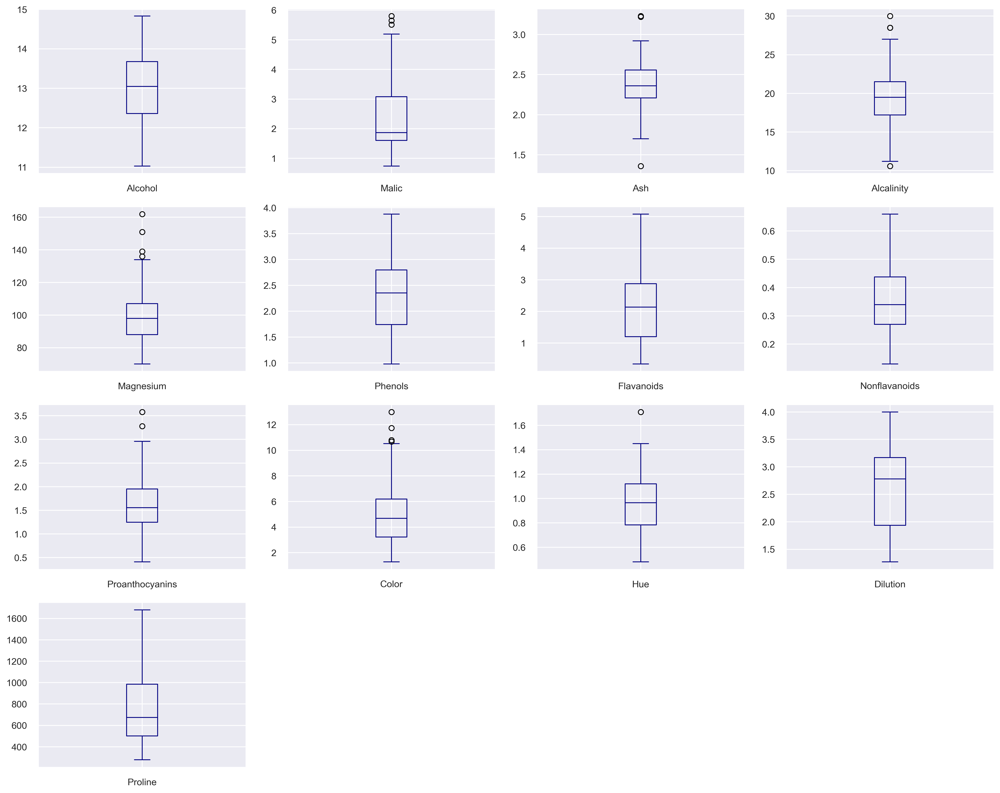

In [76]:
df.plot( kind = 'box', subplots = True, layout = (4,4), sharex = False,
        sharey = False, color='navy',figsize= (20,16))
plt.show()

* ##### <font color ='green'><u> Scatterplot for Independent Variable: </u>

In [77]:
sns.pairplot(df)

<Axes: >

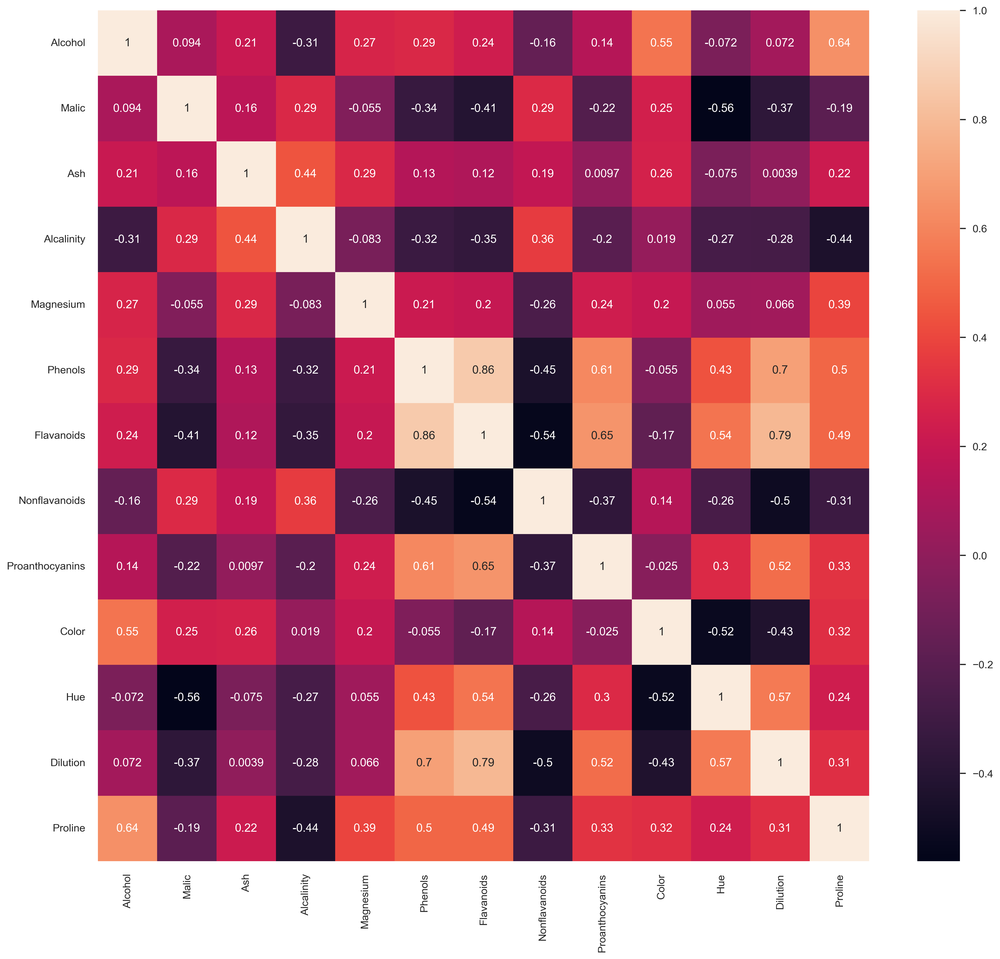

In [72]:
plt.figure(figsize= (18,16))
sns.heatmap(df.corr(), annot= True)

* ##### <font color ='green'><u> Scatter plot cluster visualization : </u>

<Axes: xlabel='Flavanoids', ylabel='Phenols'>

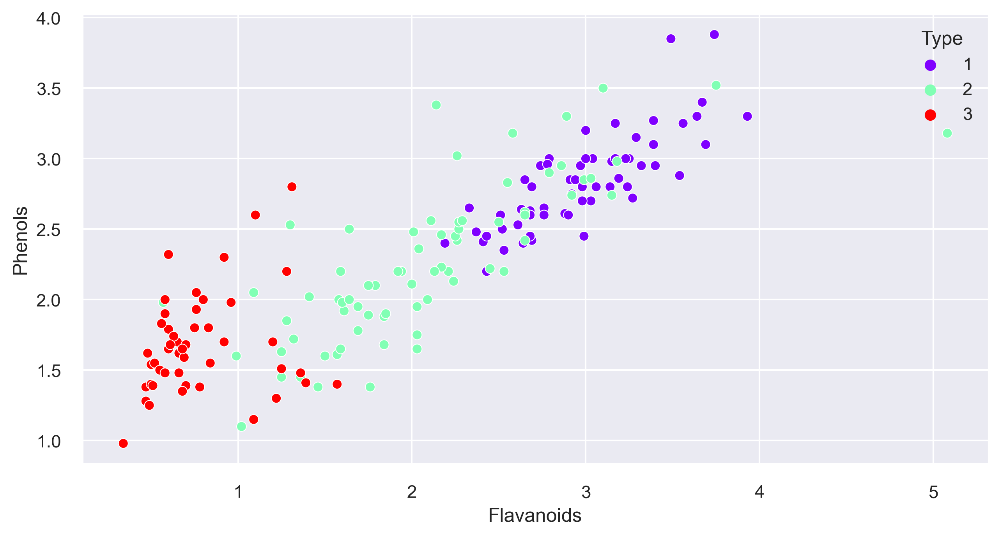

In [113]:
sns.scatterplot(x = raw_data['Flavanoids'], y = raw_data['Phenols'],
                hue = raw_data['Type'], palette= 'rainbow')

In [121]:
raw_data['Type'].value_counts()

2    71
1    59
3    48
Name: Type, dtype: int64

> * #### In histogram we see the distribution of data, some of the variables are skewd.
> * #### In Barplot for Target Variable we observe that there are 3 Types of Wine.
> * #### Boxplot shows that there are 7 variables with outliers.
> * #### Variables 'Flavanoids' and 'Phenols' have high positive correlation 86%.
> * #### Also 'Dilution' with 'Flavanoids' and 'Dilution' with 'Phenols'  have high positive correlation around 70-80%.

___

* ### <font color = 'blue'> <u> FEATURE SCALING </u>

 ### <font color ='green'> ➡ <u>Standardisation:</u>

In [79]:
sc = StandardScaler()
x_sc = sc.fit_transform(df)
x_sc

array([[ 1.51861254, -0.5622498 ,  0.23205254, ...,  0.36217728,
         1.84791957,  1.01300893],
       [ 0.24628963, -0.49941338, -0.82799632, ...,  0.40605066,
         1.1134493 ,  0.96524152],
       [ 0.19687903,  0.02123125,  1.10933436, ...,  0.31830389,
         0.78858745,  1.39514818],
       ...,
       [ 0.33275817,  1.74474449, -0.38935541, ..., -1.61212515,
        -1.48544548,  0.28057537],
       [ 0.20923168,  0.22769377,  0.01273209, ..., -1.56825176,
        -1.40069891,  0.29649784],
       [ 1.39508604,  1.58316512,  1.36520822, ..., -1.52437837,
        -1.42894777, -0.59516041]])

In [80]:
x_sc.shape

(178, 13)

___

* ### <font color = 'blue'> <u> DIMENSIONALITY REDUCTION - PCA</u>

In [81]:
pca = PCA()
pcs = pca.fit_transform(x_sc)
pd.DataFrame(pcs)

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,3.316751,-1.443463,-0.165739,-0.215631,0.693043,-0.223880,0.596427,0.065139,0.641443,1.020956,-0.451563,0.540810,-0.066239
1,2.209465,0.333393,-2.026457,-0.291358,-0.257655,-0.927120,0.053776,1.024416,-0.308847,0.159701,-0.142657,0.388238,0.003637
2,2.516740,-1.031151,0.982819,0.724902,-0.251033,0.549276,0.424205,-0.344216,-1.177834,0.113361,-0.286673,0.000584,0.021717
3,3.757066,-2.756372,-0.176192,0.567983,-0.311842,0.114431,-0.383337,0.643593,0.052544,0.239413,0.759584,-0.242020,-0.369484
4,1.008908,-0.869831,2.026688,-0.409766,0.298458,-0.406520,0.444074,0.416700,0.326819,-0.078366,-0.525945,-0.216664,-0.079364
...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,-3.370524,-2.216289,-0.342570,1.058527,-0.574164,-1.108788,0.958416,-0.146097,-0.022498,-0.304117,0.139228,0.170786,-0.114427
174,-2.601956,-1.757229,0.207581,0.349496,0.255063,-0.026465,0.146894,-0.552427,-0.097969,-0.206061,0.258198,-0.279431,-0.187371
175,-2.677839,-2.760899,-0.940942,0.312035,1.271355,0.273068,0.679235,0.047024,0.001222,-0.247997,0.512492,0.698766,0.072078
176,-2.387017,-2.297347,-0.550696,-0.688285,0.813955,1.178783,0.633975,0.390829,0.057448,0.491490,0.299822,0.339821,-0.021866


> * #### Overall 13 PCAs are generated for our data. Let's see the variance captured by them.

In [87]:
# Variance Captured by All PCAs : 
var = np.cumsum(pca.explained_variance_ratio_)
var

array([0.36198848, 0.55406338, 0.66529969, 0.73598999, 0.80162293,
       0.85098116, 0.89336795, 0.92017544, 0.94239698, 0.96169717,
       0.97906553, 0.99204785, 1.        ])

In [91]:
percent_var= np.round(var,decimals = 4)*100
percent_var

array([ 36.2 ,  55.41,  66.53,  73.6 ,  80.16,  85.1 ,  89.34,  92.02,
        94.24,  96.17,  97.91,  99.2 , 100.  ])

### <font color ='green'> ➡ <u> Scree Plot : </u>

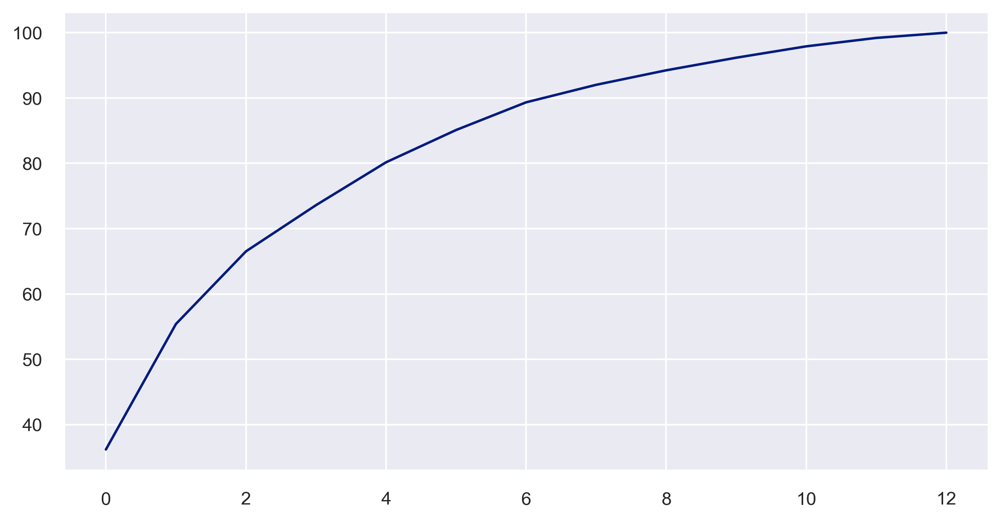

In [146]:
plt.plot(percent_var)

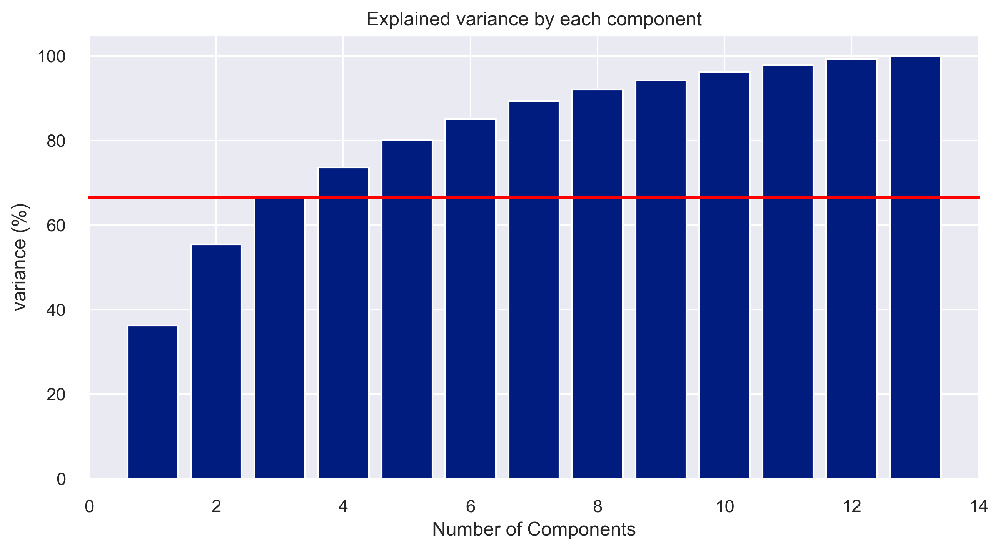

In [97]:
plt.bar(range(1, len(percent_var)+1), percent_var)
plt.xlabel('Number of Components')
plt.ylabel('variance (%)')
plt.title('Explained variance by each component')
plt.axhline(66.53, color = 'red')

> * #### Problem statement stated to implement K-Means And Hierarchial Clustering using  first three PCAs.
> * #### First three components cover 66.53% Variance.

In [103]:
pca = PCA(n_components=3)
pca_data = pca.fit_transform(x_sc)
pca_data = pd.DataFrame(pca_data,columns=['PC1','PC2','PC3'])
pca_data.head()

,PC1,PC2,PC3
0,3.316751,-1.443463,-0.165739
1,2.209465,0.333393,-2.026457
2,2.516740,-1.031151,0.982819
3,3.757066,-2.756372,-0.176192
4,1.008908,-0.869831,2.026688


___

* ### <font color = 'blue'> <u> MODEL BUILDING </u>

### <font color = 'magenta'> 1. <u>HIERARCHIAL CLUSTERING ALGORITHM </u><a class="anchor" id="1"></a>

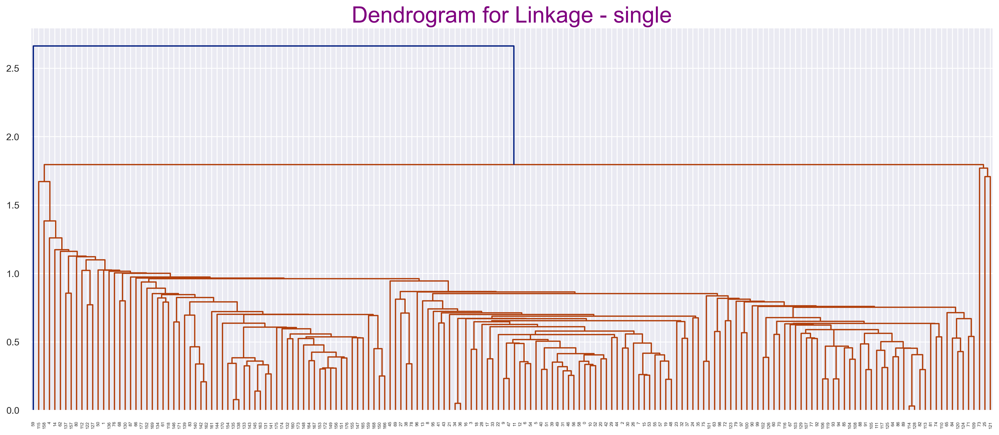

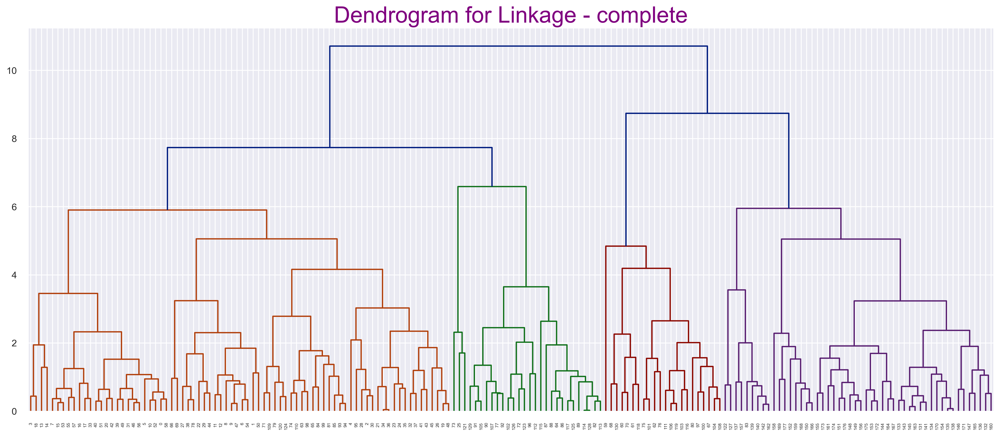

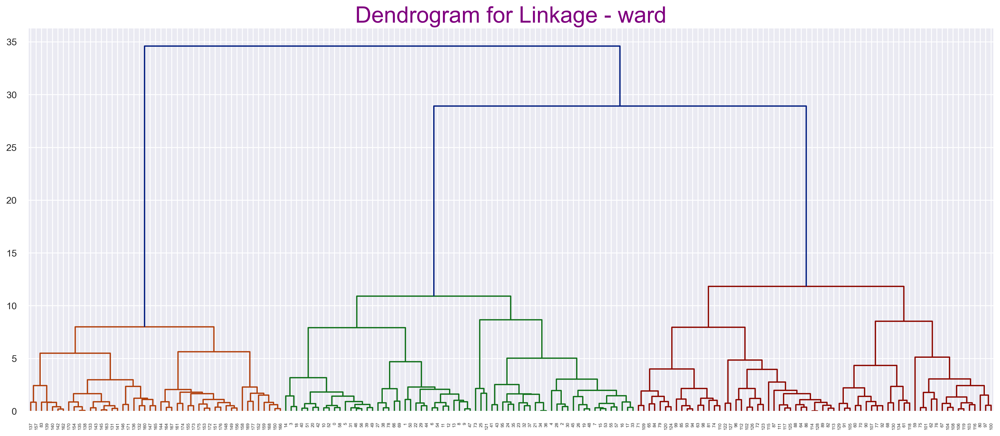

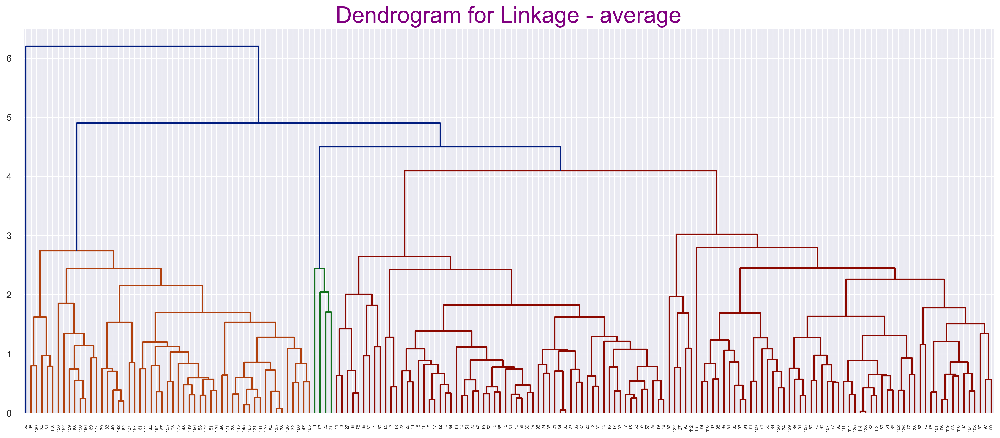

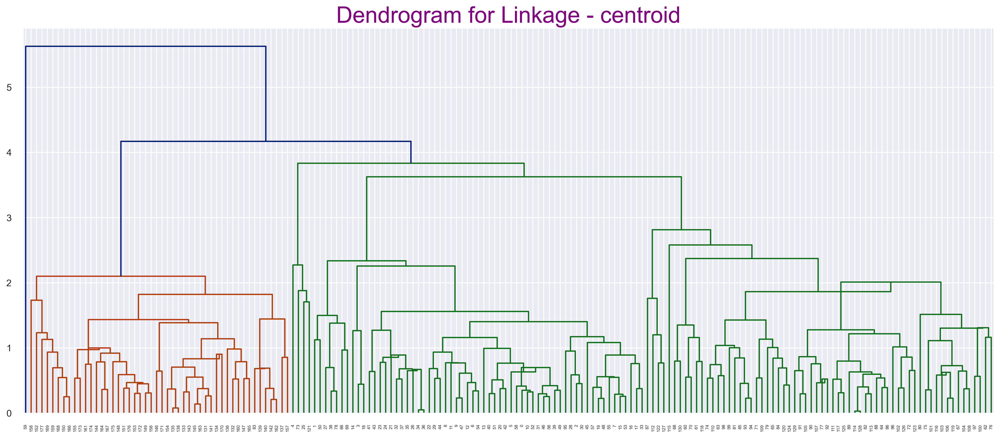

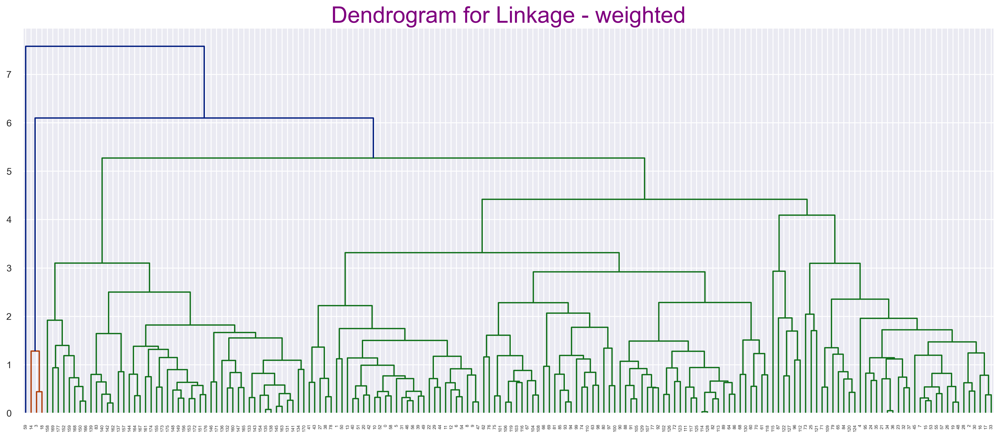

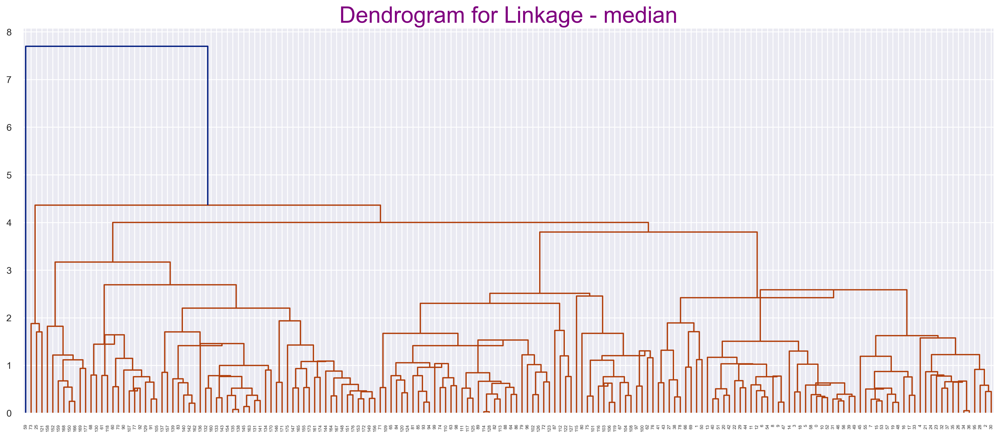

In [104]:
for methods in ['single','complete','ward','average','centroid','weighted','median']:
    plt.figure(figsize =(20, 8)) 
    
    dict = {'fontsize':26,'fontweight' :20, 'color' : 'purple'}
    plt.title('Dendrogram for Linkage - {}'.format(methods), fontdict = dict)
    denrograms_other = sch.dendrogram(sch.linkage(pca_data, method = methods,optimal_ordering= False))

> * #### In Ward linkage method if we make a cut at longest verticle line, we can clearly get 3 different clusters.
> * #### So, we for our model building purpose we go with <u> Ward Linkage Method</u> as type of linkage.

### <font color ='green'> ➡ <u> Ward Linkage Method : </u>

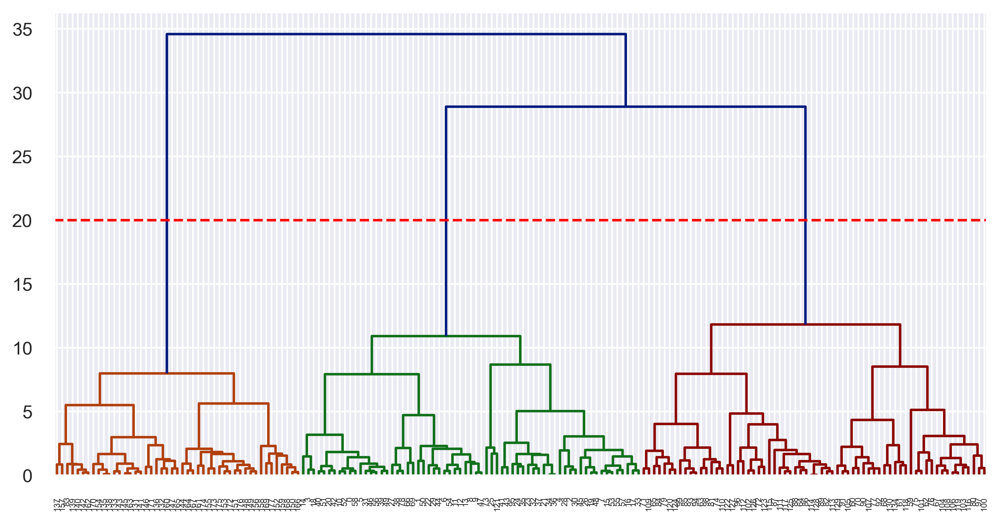

In [107]:
dendro_ward = sch.dendrogram(sch.linkage(pca_data, method= "ward"))
plt.axhline(y= 20, c= "red", linestyle= "--")

* ##### <font color ='olive'><u> Clustering Data with Hierarchical Clustering: </u>

In [109]:
HC = AgglomerativeClustering(n_clusters= 3) 

Clusters_HC = HC.fit_predict(pca_data)
Clusters_HC

array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0,
       2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1], dtype=int64)

In [118]:
hc_data = pca_data.copy()
hc_data['Cluster_HC'] = Clusters_HC
hc_data.head()

,PC1,PC2,PC3,Cluster_HC
0,3.316751,-1.443463,-0.165739,2
1,2.209465,0.333393,-2.026457,2
2,2.516740,-1.031151,0.982819,2
3,3.757066,-2.756372,-0.176192,2
4,1.008908,-0.869831,2.026688,2


* ##### <font color ='olive'><u> Scatter plot for cluster visualization : </u>

<Axes: xlabel='PC1', ylabel='PC2'>

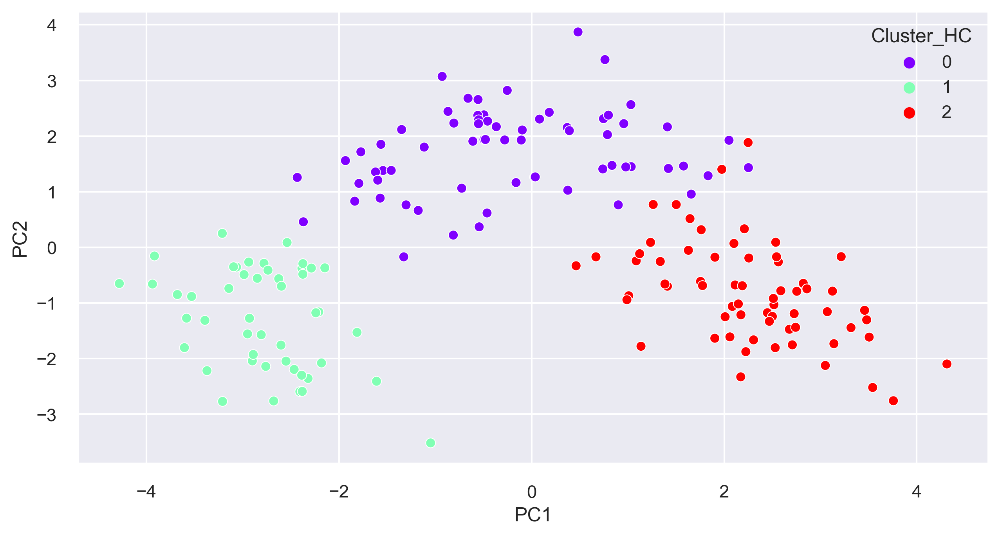

In [119]:
sns.scatterplot(x = hc_data['PC1'], y = hc_data['PC2'],
                hue = hc_data['Cluster_HC'], palette= 'rainbow')

In [120]:
hc_data['Cluster_HC'].value_counts()

0    66
2    65
1    47
Name: Cluster_HC, dtype: int64

* ##### <font color ='olive'><u> Model Evaluation for Hierarchical Clustering : </u>

In [125]:
y_hc = hc_data['Cluster_HC']

In [128]:
xtrain_hc, xtest_hc, ytrain_hc, ytest_hc = train_test_split(pca_data, y_hc, test_size= 0.15, 
                                                            random_state= 42)

In [142]:
lg = LogisticRegression()

lg.fit(xtrain_hc, ytrain_hc)
ypred_hc = lg.predict(xtest_hc)
print(classification_report(ytest_hc, ypred_hc))
print("_______________________________________________________")
print("Accuracy Score for Hierarchical Clustering =", 
      round(accuracy_score(ytest_hc, ypred_hc)* 100,2),"%")

              precision    recall  f1-score   support

           0       0.91      1.00      0.95        10
           1       1.00      1.00      1.00         7
           2       1.00      0.90      0.95        10

    accuracy                           0.96        27
   macro avg       0.97      0.97      0.97        27
weighted avg       0.97      0.96      0.96        27

_______________________________________________________
Accuracy Score for Hierarchical Clustering = 96.3 %


> * #### As there are low data points Hierarchical Clustering works efficiently and recognised 3 clusters same as original data set with maximum accuracy of 96.3%.
> * #### Now, Let's see if we get the same number of clusters with K-Means Clustering Algorithm.

___

### <font color = 'magenta'> 2. <u>K-MEANS CLUSTERING ALGORITHM </u><a class="anchor" id="2"></a>

* ##### <font color ='olive'><u> Selection of K : </u>

In [143]:
# Computing wcss value:
wcss = []

for i in range(1,15):
    km = KMeans(n_clusters=i)
    km.fit_predict(pca_data)
    wcss.append(km.inertia_)   # inertia_ function computes wcss value 

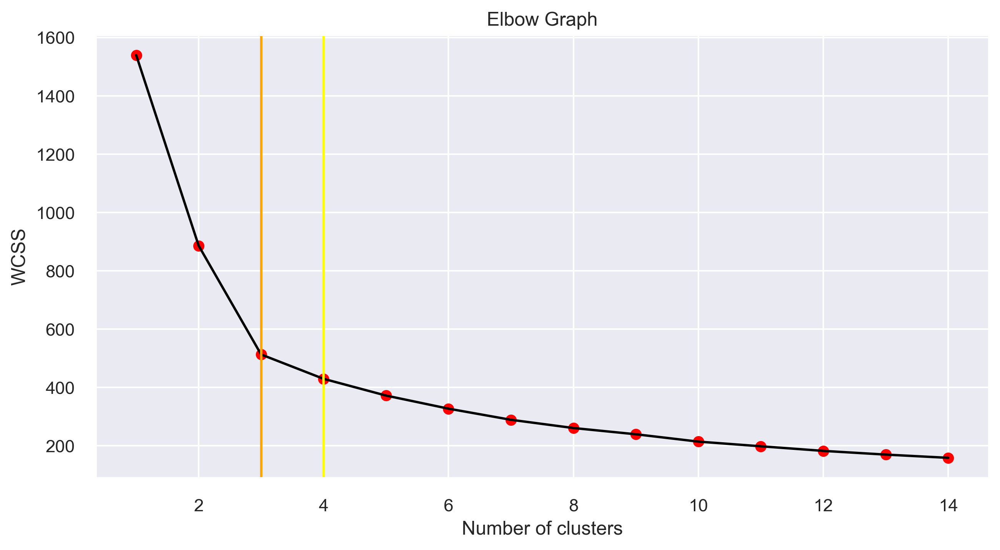

In [151]:
# Elbow Graph for Normalised Data:
plt.plot(range(1,15),wcss,color = 'black')
plt.scatter(range(1,15),wcss,color='red')
plt.title('Elbow Graph')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.axvline(3, c = 'orange')
plt.axvline(4, c = 'yellow')

In [169]:
# Silhoutte Score:
sil_score = []

for i in range(2,8):
    km = KMeans(n_clusters=i)
    y_kmeans = km.fit_predict(pca_data)
    sil_score.append(silhouette_score(pca_data, y_kmeans))

In [170]:
sil_score

[0.38938813089003277,
 0.4532351215683952,
 0.4102556031823672,
 0.36033876224267547,
 0.3396477231532997,
 0.33094044278195117]

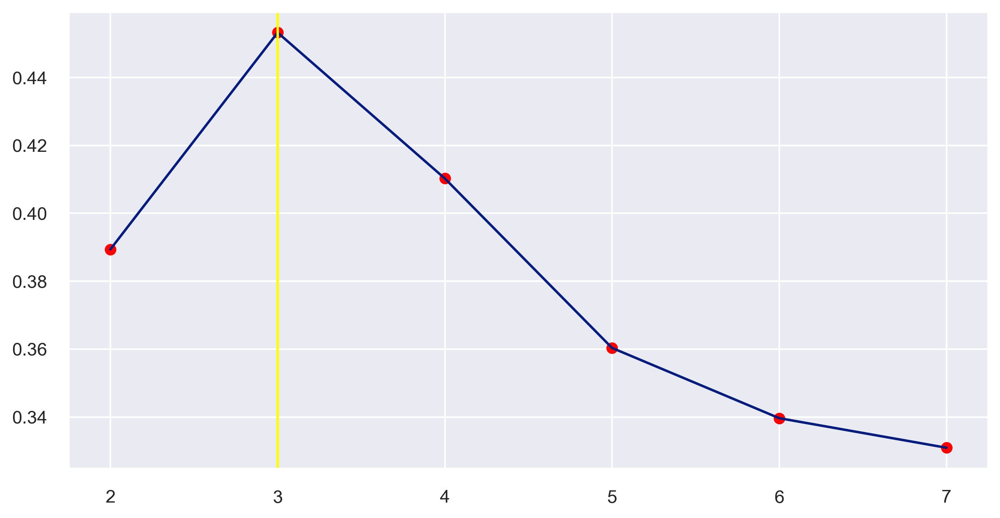

In [174]:
# Ploting Silhoutte Score:
plt.plot(range(2,8),sil_score)
plt.scatter(range(2,8), sil_score, color='red')
plt.axvline(3, c = 'yellow')

> * #### Highest Silhoutte Score is for K =3

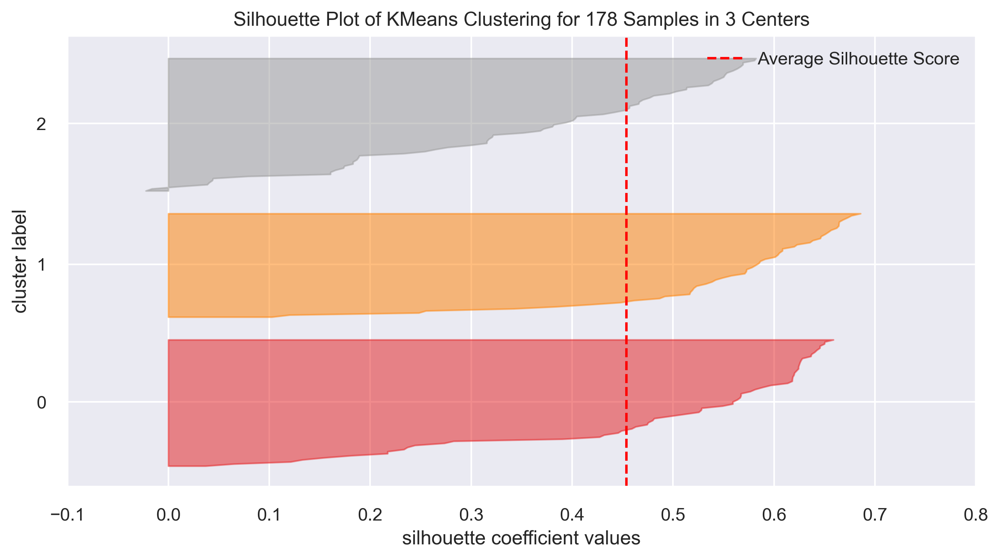

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 178 Samples in 3 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [173]:
# Visualisation of Silhoutte Score for K = 3:
model = SilhouetteVisualizer(KMeans(n_clusters = 3))
vis = model.fit(pca_data)
vis.show()

* ##### <font color ='olive'><u> Clustering Data with K-Means Clustering: </u>

In [175]:
km = KMeans(n_clusters= 3)
Clusters_k = km.fit_predict(pca_data)
Clusters_k

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 2, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2])

In [177]:
k_data = pca_data.copy()
k_data['Cluster_K'] = Clusters_k
k_data.head()

,PC1,PC2,PC3,Cluster_K
0,3.316751,-1.443463,-0.165739,1
1,2.209465,0.333393,-2.026457,1
2,2.516740,-1.031151,0.982819,1
3,3.757066,-2.756372,-0.176192,1
4,1.008908,-0.869831,2.026688,1


* ##### <font color ='olive'><u> Scatter plot for cluster visualization : </u>

<Axes: xlabel='PC1', ylabel='PC2'>

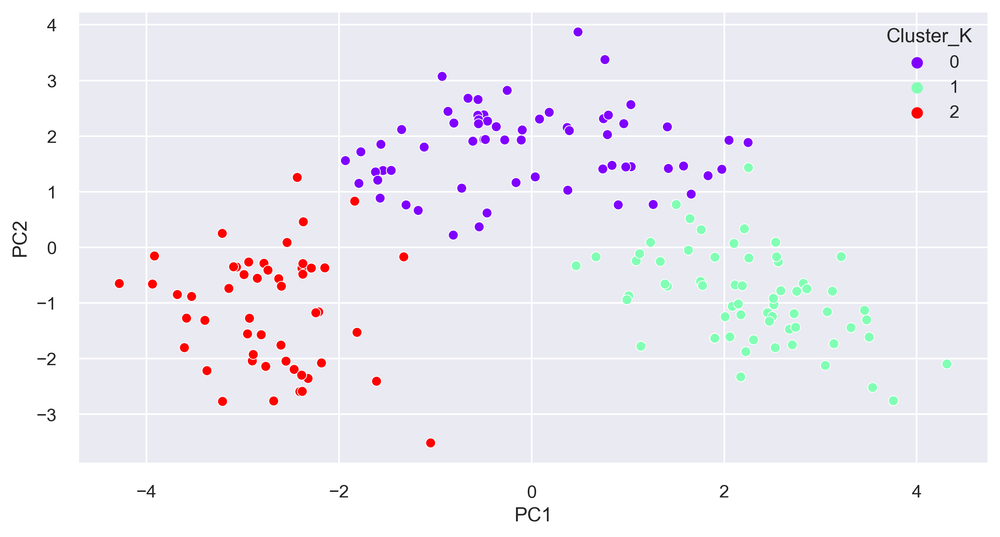

In [178]:
sns.scatterplot(x = k_data['PC1'], y = k_data['PC2'],
                hue = k_data['Cluster_K'], palette= 'rainbow')

In [179]:
k_data['Cluster_K'].value_counts()

0    64
1    63
2    51
Name: Cluster_K, dtype: int64

* ##### <font color ='olive'><u> Model Evaluation for K-Means Clustering : </u>

In [181]:
y_k = k_data['Cluster_K']

In [182]:
xtrain_k, xtest_k, ytrain_k, ytest_k = train_test_split(pca_data, y_k, test_size= 0.15, 
                                                            random_state= 42)

In [183]:
lg.fit(xtrain_k, ytrain_k)
ypred_k = lg.predict(xtest_k)
print(classification_report(ytest_k, ypred_k))
print("_______________________________________________________")
print("Accuracy Score for K-Means Clustering =", 
      round(accuracy_score(ytest_k, ypred_k)* 100,2),"%")

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        10
           1       1.00      1.00      1.00         9
           2       1.00      1.00      1.00         8

    accuracy                           1.00        27
   macro avg       1.00      1.00      1.00        27
weighted avg       1.00      1.00      1.00        27

_______________________________________________________
Accuracy Score for Hierarchical Clustering = 100.0 %


> * #### K-Means Clustering also recognised 3 clusters same as original data set and Hierarchical Clustering with 100%  accuracy.

___

* ### <font color = 'blue'> <u> CONCLUSION </u>
    
    + #### Original Data have 3 types of wine 
    + #### With first 3 Principle Component scores, which captured 66.53% of variance, we got the same clustering of data i.e. 3 Clusters by both Hierarchical Clustering and K-Means Clustering Techniques.

<br>
<br>
<br>

> # <font color = 'magenta'><u>END</u>
___